# Food-101 Classification

## Part 1: Setup and Data Exploration

The Food-101 dataset poses a fine grained classification challenge with minimal input data. 101 food classes are represented with 1000 images per class. 250 images from each class are designated for the test set, leaving 750 images per class for training and validation datasets.

This notebook shows partitioning the data into training and testing sets as well as exploration of the dataset. No specific validation set will be created at this stage - it will be drawn from a random sample from the training set during training.

In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
from fastai import *
from fastai.vision import *
from shutil import copyfile
import seaborn as sns

In [3]:
path = Path('../data/food-101/')
path_img = path/'images'
path_meta = path/'meta'

In [4]:
path_train = path/'data/train'

### Test Data

Food-101 Dataset, downloaded from [here](https://www.vision.ee.ethz.ch/datasets_extra/food-101/)

Dataset contains 101,000 images across 101 classes. The dataset is split into 75,750 training and 25,250 test images, as defined by `test.json` and `train.json`.

In [5]:
Path.mkdir(path/'data', exist_ok=True)

In [6]:
test_json = open(path_meta/'test.json', 'r')
test_json = json.load(test_json)
classes = list(test_json.keys())

In [7]:
classes[:10]

['churros',
 'hot_and_sour_soup',
 'samosa',
 'sashimi',
 'pork_chop',
 'spring_rolls',
 'panna_cotta',
 'beef_tartare',
 'greek_salad',
 'foie_gras']

In [8]:
path_test = path/'data/test'
Path.mkdir(path_test, exist_ok=True)

In [9]:
for clas in classes:
    Path.mkdir(path_test/clas, exist_ok=True)
    files = test_json[clas]
    
    for file in files:
        filename = file + '.jpg'
        copyfile(path_img/filename, path_test/filename)

### Train Data

In [10]:
train_json = open(path_meta/'train.json', 'r')
train_json = json.load(train_json)
classes = list(train_json.keys())

In [5]:
path_train = path/'data/train'

In [11]:
Path.mkdir(path_train, exist_ok=True)

In [12]:
for clas in classes:
    Path.mkdir(path_train/clas, exist_ok=True)
    files = train_json[clas]
    
    for file in files:
        filename = file + '.jpg'
        copyfile(path_img/filename, path_train/filename)

In [13]:
path_data = path/'data'

# Exploration

In [5]:
raw_data = ImageList.from_folder(path/'data').split_by_folder(train='train', valid='test').label_from_folder(classes=None)

In [6]:
raw_data

LabelLists;

Train: LabelList (75750 items)
x: ImageList
Image (3, 512, 308),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512)
y: CategoryList
apple_pie,apple_pie,apple_pie,apple_pie,apple_pie
Path: ..\data\food-101\data;

Valid: LabelList (25250 items)
x: ImageList
Image (3, 512, 512),Image (3, 512, 384),Image (3, 512, 384),Image (3, 512, 382),Image (3, 342, 512)
y: CategoryList
apple_pie,apple_pie,apple_pie,apple_pie,apple_pie
Path: ..\data\food-101\data;

Test: None

Here is the list of 101 classes represented in the dataset

In [7]:
raw_data.classes

['apple_pie',
 'baby_back_ribs',
 'baklava',
 'beef_carpaccio',
 'beef_tartare',
 'beet_salad',
 'beignets',
 'bibimbap',
 'bread_pudding',
 'breakfast_burrito',
 'bruschetta',
 'caesar_salad',
 'cannoli',
 'caprese_salad',
 'carrot_cake',
 'ceviche',
 'cheese_plate',
 'cheesecake',
 'chicken_curry',
 'chicken_quesadilla',
 'chicken_wings',
 'chocolate_cake',
 'chocolate_mousse',
 'churros',
 'clam_chowder',
 'club_sandwich',
 'crab_cakes',
 'creme_brulee',
 'croque_madame',
 'cup_cakes',
 'deviled_eggs',
 'donuts',
 'dumplings',
 'edamame',
 'eggs_benedict',
 'escargots',
 'falafel',
 'filet_mignon',
 'fish_and_chips',
 'foie_gras',
 'french_fries',
 'french_onion_soup',
 'french_toast',
 'fried_calamari',
 'fried_rice',
 'frozen_yogurt',
 'garlic_bread',
 'gnocchi',
 'greek_salad',
 'grilled_cheese_sandwich',
 'grilled_salmon',
 'guacamole',
 'gyoza',
 'hamburger',
 'hot_and_sour_soup',
 'hot_dog',
 'huevos_rancheros',
 'hummus',
 'ice_cream',
 'lasagna',
 'lobster_bisque',
 'lobster

## Image Dimensions

We know from the [Food-101 Paper](https://www.vision.ee.ethz.ch/datasets_extra/food-101/static/bossard_eccv14_food-101.pdf) that every image in the dataset is resized to be 512 on one size, but it's worth looking at the distribution of image sizes in dataset.

In [8]:
image_data = [[i[0].shape[1], i[0].shape[2], i[1].obj] for i in raw_data.valid]

In [9]:
data_df = pd.DataFrame(image_data, columns=['Height', 'Width', 'Class'])

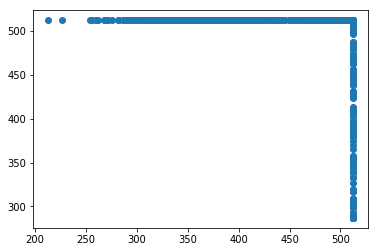

In [10]:
# scatter of width and height values
plt.scatter(data_df.Height, data_df.Width)

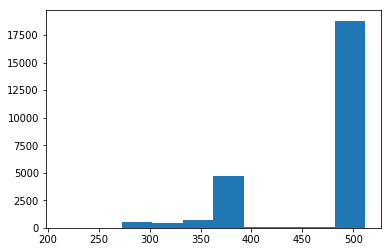

In [11]:
# histogram of image heights
plt.hist(data_df.Height);

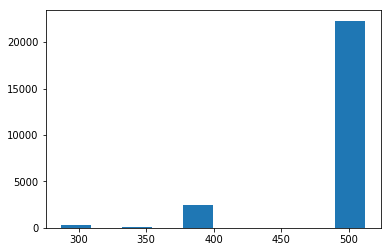

In [12]:
# histogram of image widths
plt.hist(data_df.Width);

In [13]:
# Percentage of images that are square (512 x 512)
# Note that since at least one size of every image is 512, if height == width the image must be (512 x 512)
(data_df.Height == data_df.Width).mean()

0.6145742574257426

So it looks like about 61% of images are 512x512 square images, but the remaining 39% are rectangular. Lets look at some images in the dataset:

In [14]:
def plot_rand(rows=6, cols=6, figsize=(16,16)):
    fig, axes = plt.subplots(rows, cols, figsize=figsize)
    
    for ax in axes.flat:
        idx = np.random.randint(0, 75000)
        show_image(raw_data.train[idx][0], ax=ax)
        ax.set_title(raw_data.train[idx][1].obj)

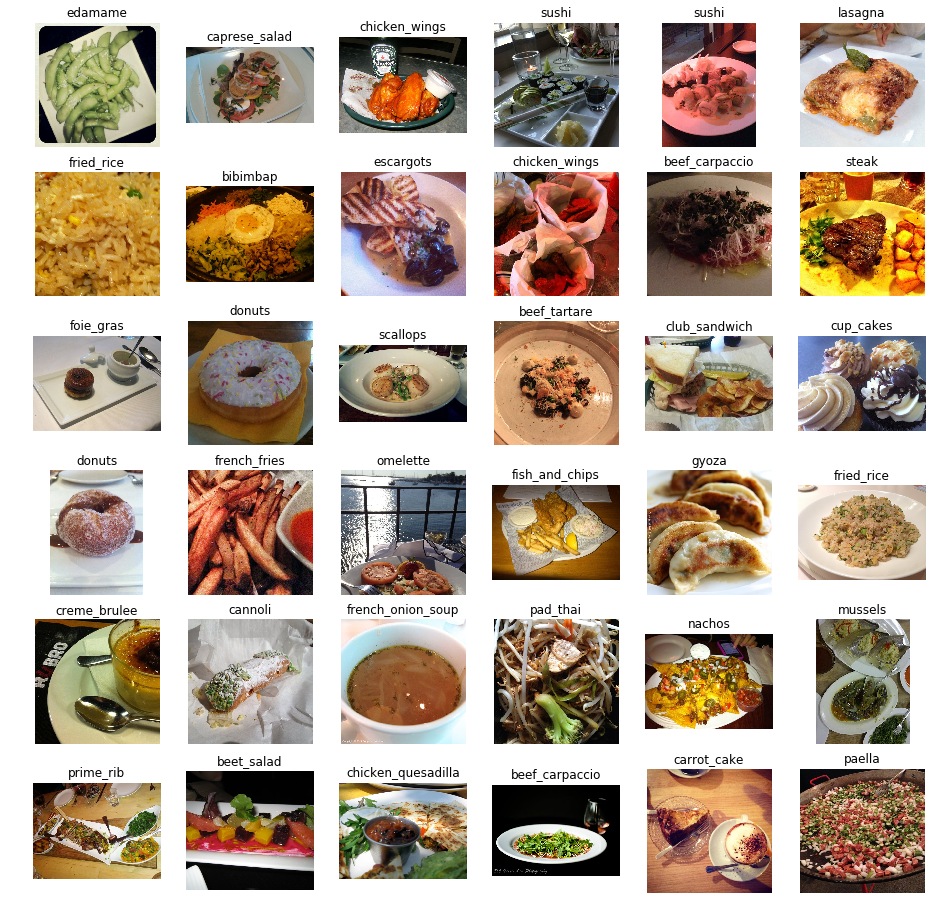

In [15]:
plot_rand()

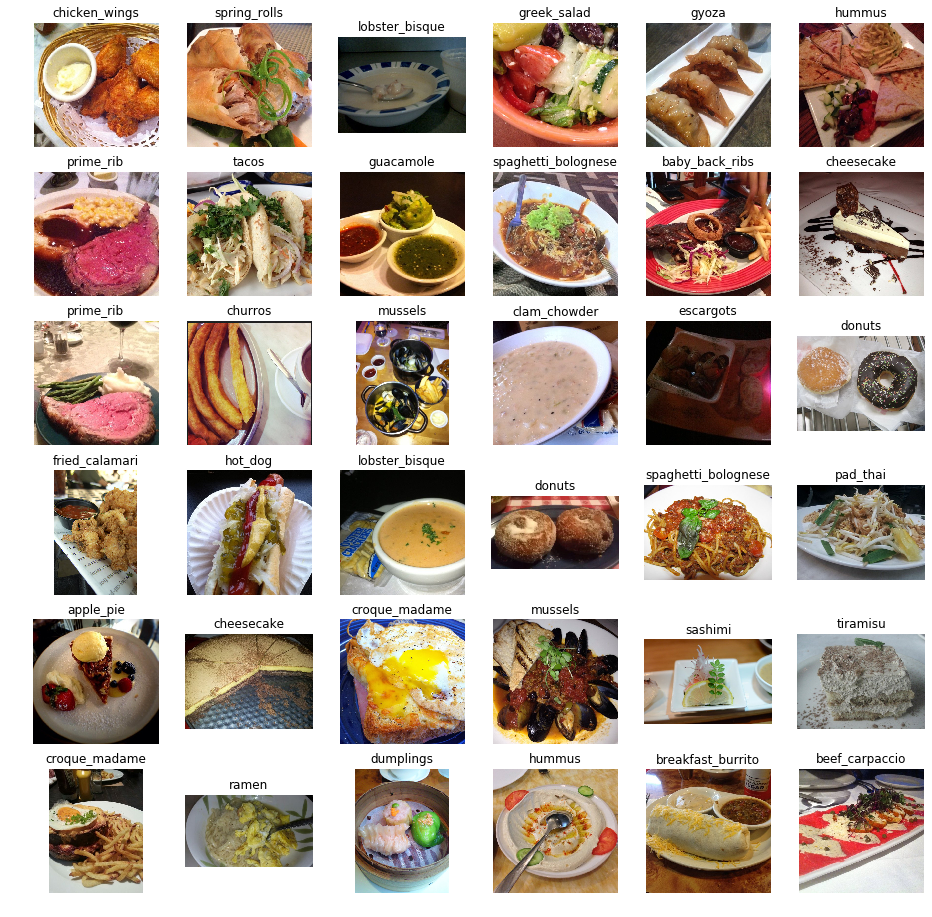

In [16]:
plot_rand()

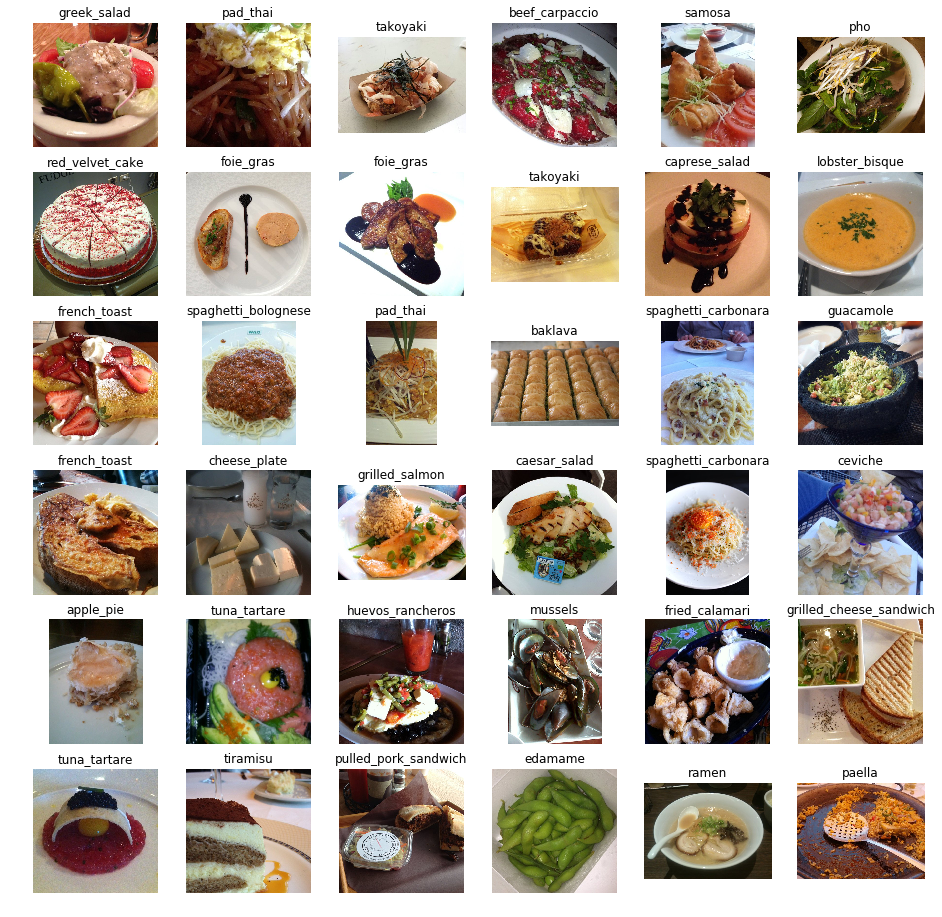

In [17]:
plot_rand()

Grabbing a random set of images gives a good sense of the challenges we can expect in the dataset. Most of these images look like amateur cellphone photographs. The lighting in a lot of the photos isn't great. Some photos are really close to the food, while others are far away.

There is also a high degree of variability within classes:

In [18]:
def class_images(image_class, count):
    class_path = path/'data/train'/image_class
    class_files = os.listdir(class_path)
    class_images = [open_image(class_path/class_files[i]) for i in range(count)]
    return class_images

In [19]:
def plot_class(image_class, count, rows=4, cols=4, figsize=(12,12)):
    
    images = class_images(image_class, count)
    fig, axes = plt.subplots(rows, cols, figsize=figsize)
    fig.suptitle(image_class)
    
    for i, ax in enumerate(axes.flat):
        show_image(images[i], ax=ax)
        
    plt.subplots_adjust(wspace=None, hspace=None)

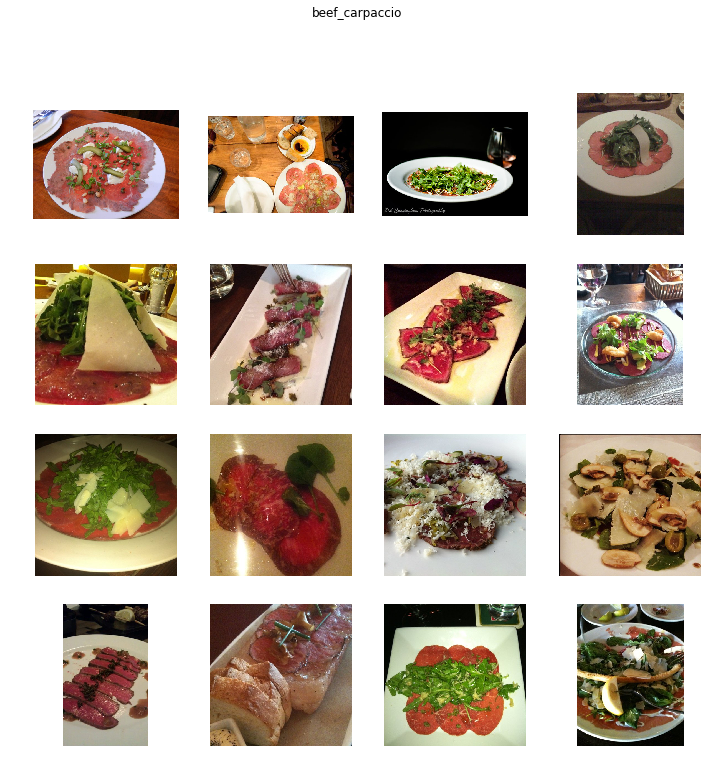

In [20]:
plot_class('beef_carpaccio', 16)

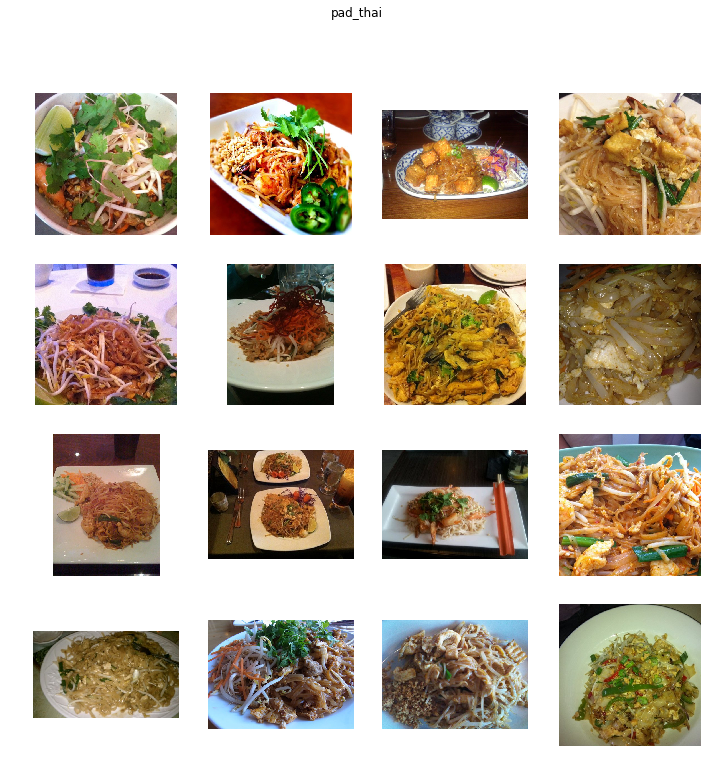

In [21]:
plot_class('pad_thai', 16)

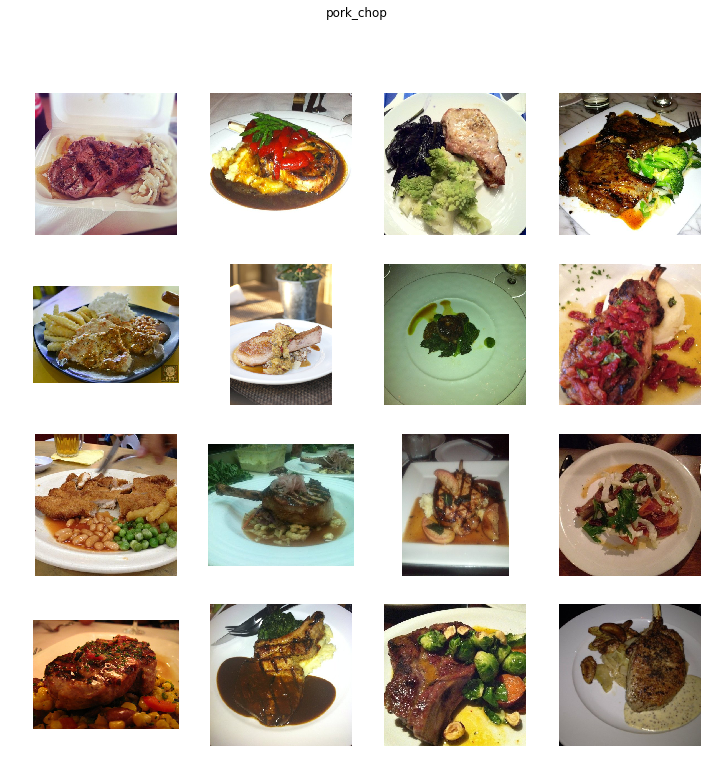

In [22]:
plot_class('pork_chop', 16)

So we have a small image dataset, poor photo quality, and high variability within classes. I've also noticed looking at a lot of these photos that many class examples contain the class as part of a larger ensemble of food. For example in the composite of pork chops above, look at the image in the second row, first column, and the image in the third row, first column. Both images contain french fries in addition to the pork chop. French fries are a standalone class themselves.

I model could identify the french fries in the images and classify the images as such. It would be technically correct - the images do contain french fries - but totally wrong with respect to the label of the image. Looking at all the composite dishes, it feels like the Food-101 dataset is really a multiclass classification problem framed as a single class classification problem. This definitely increases the challenge of the dataset.

And if that wasn't enough, there are also different classes that look extremely similar.

In [23]:
def plot_two(class1, class2, rows=4, cols=4, figsize=(12,12)):
    count = rows*cols//2
    class1_images = class_images(class1, count)
    class2_images = class_images(class2, count)
    images = [j for i in zip(class1_images, class2_images) for j in i]
    
    fig, axes = plt.subplots(rows, cols, figsize=figsize)
    
    for i, ax in enumerate(axes.flat):
        show_image(images[i], ax=ax)
        label = class1 if i%2 == 0 else class2
        ax.set_title(label)
        
    plt.subplots_adjust(wspace=None, hspace=None)

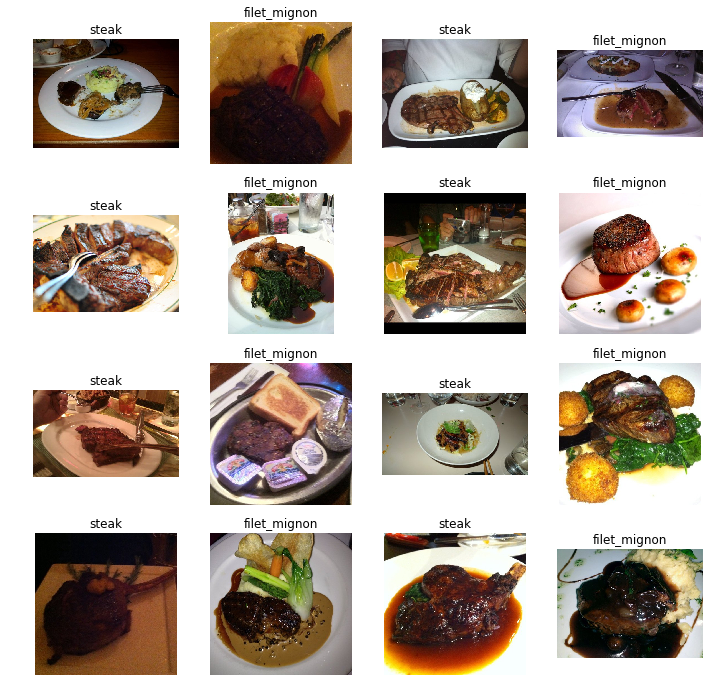

In [24]:
plot_two('steak', 'filet_mignon')

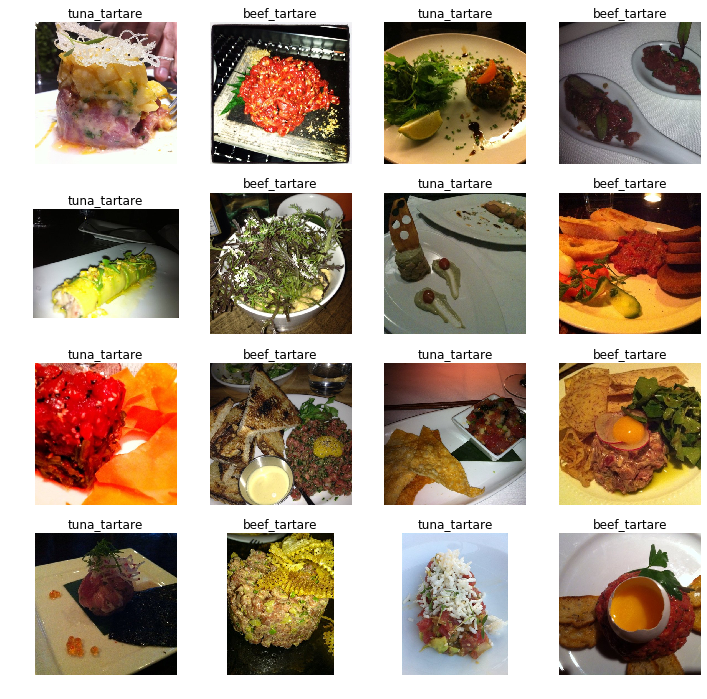

In [25]:
plot_two('tuna_tartare', 'beef_tartare')

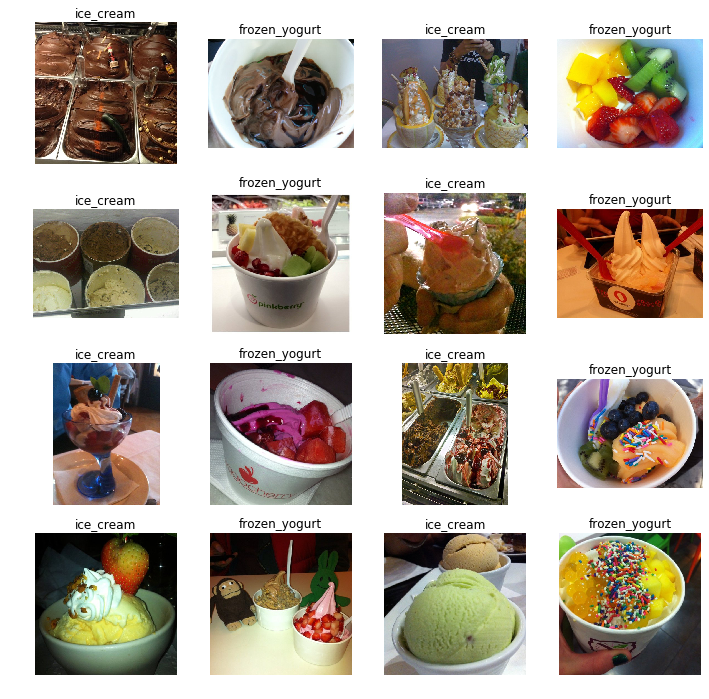

In [26]:
plot_two('ice_cream', 'frozen_yogurt')

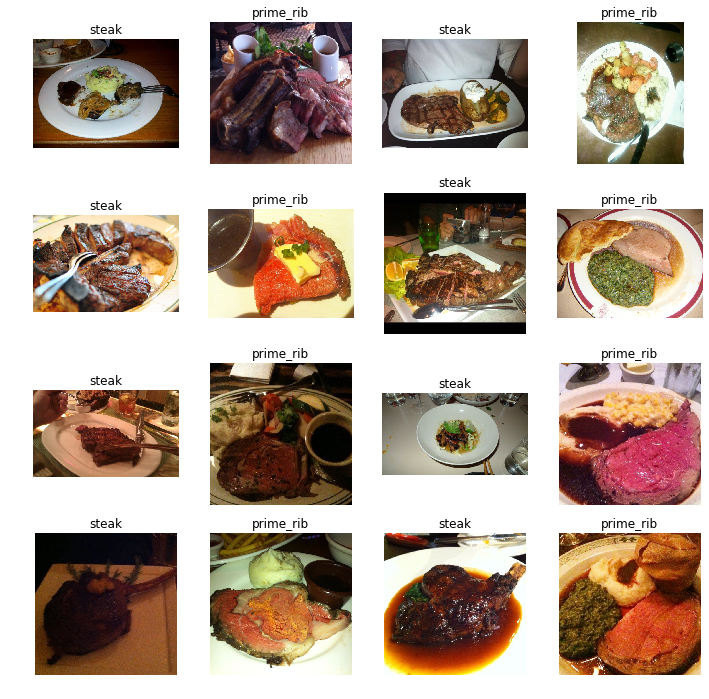

In [27]:
plot_two('steak', 'prime_rib')

So - small dataset, label noise, poor quality images and highly similar classes. How do we deal with this? The best way forward is to rely on data augmentation and regularization to train a model that can perform given these constraints.